# Belady's Anomaly (FIFO)

In [15]:
import random
import sys
import time
import matplotlib.pyplot as plt
import numpy as np

In [16]:


def dequeue(arr):
    arr.pop(0)
    
def enq(arr,value, max):
    if len(arr) == max:
        dequeue(arr)
        arr.append(value)
    else:
        arr.append(value)
    
    

In [20]:
reference_string = [0,1,5,3,0,1,4,0,1,5,3,4]
max_frame_size = 3
queue = []

hit_miss = 0

for i in range(len(reference_string)):
    if reference_string[i] in queue:
        continue
    else:
        enq(queue, reference_string[i], max_frame_size)
        hit_miss+=1
    print(queue)
    
print(hit_miss)
    

[0]
[0, 1]
[0, 1, 5]
[1, 5, 3]
[5, 3, 0]
[3, 0, 1]
[0, 1, 4]
[1, 4, 5]
[4, 5, 3]
9


In [22]:
reference_string = [0,1,5,3,0,1,4,0,1,5,3,4]
max_frame_size = 4
queue = []

hit_miss = 0

for i in range(len(reference_string)):
    if reference_string[i] in queue:
        continue
    else:
        enq(queue, reference_string[i], max_frame_size)
        hit_miss+=1
    print(queue)
    
print(hit_miss)
    

[0]
[0, 1]
[0, 1, 5]
[0, 1, 5, 3]
[1, 5, 3, 4]
[5, 3, 4, 0]
[3, 4, 0, 1]
[4, 0, 1, 5]
[0, 1, 5, 3]
[1, 5, 3, 4]
10


We see that the number of page faults are increasing with increase in frame size. So, now we create a belady anomaly function to check for various reference strings and various lengths and process sizes.

In [12]:

def BeladyAnomaly(reference_string, proc_size):

    page_faults = []

    for i in range(2,proc_size):
        frame_size = i
        queue = []
        temp_page_faults = 0
        for j in range(len(reference_string)):
            if reference_string[j] in queue:
                continue 
            else:
                temp_page_faults += 1
                if(len(queue) < frame_size):
                    queue.append(reference_string[j])
                else:
                    queue.pop(0)
                    queue.append(reference_string[j])
        page_faults.append(temp_page_faults)
            
    return page_faults

In [13]:
hit_miss = BeladyAnomaly([0,1,5,3,0,1,4,0,1,5,3,4], 3)
print(hit_miss)

[12]


In [14]:
hit_miss = BeladyAnomaly([0,1,5,3,0,1,4,0,1,5,3,4], 4)
print(hit_miss)

[12, 9]


In [17]:
page_faults = 0

for i in hit_miss:
    if i == "miss":
        page_faults +=1

In [9]:
print("The number of page faults are " + str(page_faults))

The number of page faults are 9


Now, if we increase the frame size = 4

In [10]:
hit_miss = BeladyAnomaly(4)
print(hit_miss)
page_faults = 0

for i in hit_miss:
    if i == "miss":
        page_faults +=1


[0]
[0, 1]
[0, 1, 5]
[0, 1, 5, 3]
[0, 1, 5, 3]
[0, 1, 5, 3]
[1, 5, 3, 4]
[5, 3, 4, 0]
[3, 4, 0, 1]
[4, 0, 1, 5]
[0, 1, 5, 3]
[1, 5, 3, 4]
['miss', 'miss', 'miss', 'miss', 'hit', 'hit', 'miss', 'miss', 'miss', 'miss', 'miss', 'miss']


In [11]:
print("the number of page faults are " + str(page_faults))

the number of page faults are 10


We see that there is an increase in the number of page faults when the frame size is increased. This is Belady's Anomaly

So, for finding anomaly bumps like the case above, we are trying for reference string lenghts in the range of 25, 12800 

In [30]:
def generate_referenceString(length,process_size):
    string = []
    for i in range(length):
        n = random.randint(0,process_size-1)
        string.append(n)
    return string

    

In [31]:

anomaly_string = np.zeros((5,10), dtype = int)
bumps_arr = np.zeros((5,10), dtype = int)

rsl = 25
all_bumps_arr = []
anomalous_strings = []
m = 0

while(rsl<=12800):

    l = 0
    #-------------------------------------------------------------------------------------
    for proc_size in range(20,120, 20):
        anomalous_stringcounts = 0
        total_bumps = 0
        #----------------------------------------------------------------------------------------------
        for j in range(1000): # taking 1000 random reference strings
           
            reference_string = generate_referenceString(rsl,proc_size)
            
            page_faults = BeladyAnomaly(reference_string, proc_size)
            
            bumps = 0
            for i in range(len(page_faults)-1):
                if page_faults[i] < page_faults[i+1]:
                    bumps = bumps+1
            print(page_faults)
            print(bumps)
            
            
            if(bumps>0):
                anomalous_stringcounts += 1
                total_bumps += bumps
        
        
        
        #-----------------------------------------------------------------------------------------------    
        anomaly_string[l][m] = anomalous_stringcounts 
        bumps_arr[l][m] = total_bumps
        l += 1
        
    
    m = m+1
            
    rsl = rsl * 2


            
            
        
            
        

[21, 20, 21, 19, 20, 19, 16, 15, 15, 14, 14, 13, 13, 13, 13, 13, 13, 13]
2
[22, 23, 15, 16, 16, 14, 16, 14, 13, 12, 12, 12, 12, 12, 12, 12, 12, 12]
3
[22, 19, 22, 18, 15, 13, 13, 11, 12, 11, 11, 11, 11, 11, 11, 11, 11, 11]
2
[24, 25, 24, 23, 19, 20, 19, 20, 19, 19, 18, 17, 18, 16, 16, 16, 16, 16]
4
[23, 22, 21, 21, 16, 16, 15, 15, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13]
0
[24, 22, 23, 22, 20, 19, 18, 15, 16, 15, 14, 13, 13, 13, 13, 13, 13, 13]
2
[25, 24, 22, 18, 15, 14, 11, 12, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11]
1
[19, 20, 19, 20, 18, 17, 16, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13]
2
[24, 23, 22, 23, 21, 22, 19, 19, 18, 19, 18, 17, 18, 16, 16, 16, 16, 16]
4
[23, 22, 23, 22, 21, 21, 18, 16, 18, 16, 15, 16, 15, 15, 15, 15, 15, 15]
3
[24, 23, 22, 21, 18, 18, 17, 16, 16, 16, 16, 15, 15, 15, 15, 15, 15, 15]
0
[22, 20, 22, 20, 18, 19, 18, 16, 14, 15, 12, 12, 12, 12, 12, 12, 12, 12]
3
[22, 23, 20, 21, 18, 17, 17, 17, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16]
2
[23, 21, 20, 19, 18, 16, 

In [32]:
print(anomaly_string)


[[ 916  962  885  654  318   51    1    0    0    0]
 [ 950  999 1000 1000  998  922  550  107    3    0]
 [ 907 1000 1000 1000 1000 1000  993  809  270   10]
 [ 859  998 1000 1000 1000 1000 1000  997  842  255]
 [ 767  999 1000 1000 1000 1000 1000 1000  994  728]]


In [33]:
print(bumps_arr)

[[ 2361  2775  1906   957   364    51     1     0     0     0]
 [ 3446  6528  7696  6350  4182  2265   765   118     3     0]
 [ 3688  8142 12456 13157 10570  7201  4219  1596   310    10]
 [ 3448  9134 15628 19542 18080 13732  9324  4897  1752   289]
 [ 3256  9824 18239 24815 25556 21243 15452  9732  4678  1248]]


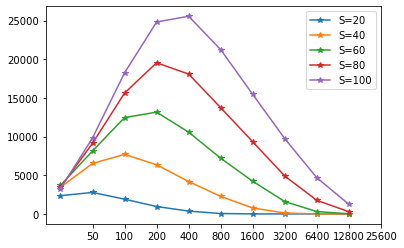

In [34]:
m = 20
for i in range(5):
    temp_str = "S=" + str(m)
    plt.plot(bumps_arr[i], "*-",label = temp_str)
    m = m+20

x = []
t = 25
while t <= 12800:
    x.append(t*2)
    t = t*2
    
xi = list(range(1,len(x)+1))
plt.xticks(xi,x)

plt.legend()
plt.show()

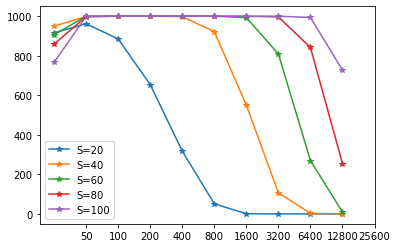

In [35]:
m = 20
for i in range(5):
    temp_str = "S=" + str(m)
    plt.plot(anomaly_string[i], "*-", label = temp_str)
    m = m+20

x = []
t = 25
while t <= 12800:
    x.append(t*2)
    t = t*2
    
xi = list(range(1,len(x)+1))
plt.xticks(xi,x)

plt.legend()
plt.show()